In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as pltc
from scipy.interpolate import griddata
from scipy.integrate import simpson

In [2]:
KBT = 8.314 * 300

def _load_plumed(fname):
    data = {}
    with open(fname, 'r') as f:
        fields = f.readline()[:-1].split(" ")[2:] # last char is '/n' and the first two are '#!' and 'FIELDS'
        for field in fields: # add fields to the colvars dict
            data[field] = []
        line = f.readline()
        while line: # read up to LINE_LIM lines
            if line[0] == "#": # Don't read comments
                line = f.readline()
                continue
            line_list = line.split()
            for i, field in enumerate(fields):
                data[field].append(float(line_list[i]))
            line = f.readline()
    if len(data["time"]) < 4000000:
        raise RuntimeError("The simulation might not have completed correctly. Check the md folder.")
    data = pd.DataFrame(data)
    data['weights'] = np.exp(data['pb.bias']*1000/KBT)
    return data

def get_fe(colvars, nbins=50):
    colvars = colvars.copy()
    init_idx = int(100 * 10000 // 2)
    colvars = colvars.iloc[init_idx:] # discard the first 100 ns of data
    colvars.dropna(inplace=True)
    # calculate histogram for all data to get bins
    counts, binsout = np.histogramdd([colvars.dcom, colvars.ang, colvars.v3cos], bins=nbins, weights=colvars.weights)
    # calculate bin centers
    binsx, binsy, binsz = binsout
    xs = np.round((binsx[1:] + binsx[:-1])/2, 2)
    ys = np.round((binsy[1:] + binsy[:-1])/2, 2)
    zs = np.round((binsz[1:] + binsz[:-1])/2, 2)

    # data frame to store the data
    data = pd.DataFrame()
    xs_unrolled = []
    ys_unrolled = []
    zs_unrolled = []
    for i in xs:
        for j in ys:
            for k in zs:
                xs_unrolled.append(i)
                ys_unrolled.append(j)
                zs_unrolled.append(k)
    
    data['dcom'] = xs_unrolled
    data['ang'] = ys_unrolled
    data['cosb'] = zs_unrolled

    counts[counts==0] = np.nan # discard empty bins
    free_energy = -KBT*np.log(counts)/1000 #kJ/mol
    free_energy_unrolled = []
    for i in range(len(xs)):
        for j in range(len(ys)):
            for k in range(len(zs)):
                free_energy_unrolled.append(free_energy[i, j, k])
    data[f"fe"] = free_energy_unrolled
    # Entropy correction along x axis
    data[f"fe"] += 2*KBT*np.log(data.dcom)/1000

    data.fe -= data[(data.dcom==2.40)].fe.values.mean()

    return data

def integrate_z_out(data_in, xcol, ycol, zcol):
    data = data_in.copy()
    data["exp"] = np.exp(-data.fe*1000/KBT)
    # integrate over Z
    Z_integrand = {"x": [], "y": [], "exp":[]}
    for x in data[xcol].unique():
        for y in data[ycol].unique():
            FE_this_xy = data[(data[xcol] == x) & (data[ycol] == y)].copy()
            FE_this_xy.sort_values(by=zcol, inplace=True)
            Z_integrand["x"].append(x)
            Z_integrand["y"].append(y)
            FE_this_xy.dropna(inplace=True)
            if FE_this_xy.empty: # if it doesn't exist, it's empty
                Z_integrand["exp"].append(0.0)
            else:
                Z_integrand["exp"].append(simpson(y=FE_this_xy.exp.to_numpy(), x=FE_this_xy[zcol].to_numpy()))
    Z_integrand['fe'] = -KBT*np.log(Z_integrand["exp"])/1000
    Z_integrand = pd.DataFrame(Z_integrand)
    Z_integrand.replace(np.inf, np.nan, inplace=True)
    return Z_integrand


def integrate_y_out(data_in, xcol, ycol):
    data = data_in.copy()
    #data.dropna(inplace=True)
    data["exp"] = np.exp(-data.fe*1000/KBT)
    # integrate over Z
    Z_integrand = {"x": [], "exp":[]}
    for x in data[xcol].unique():
        FE_this_x = data[(data[xcol] == x)].copy()
        FE_this_x.sort_values(by=ycol, inplace=True)
        Z_integrand["x"].append(x)
        FE_this_x.dropna(inplace=True)
        if FE_this_x.empty: # if it doesn't exist, it's empty
            Z_integrand["exp"].append(0.0)
        else:
            Z_integrand["exp"].append(simpson(y=FE_this_x.exp.to_numpy(), x=FE_this_x[ycol].to_numpy()))
                
    Z_integrand['fe'] = -KBT*np.log(Z_integrand["exp"])/1000
    Z_integrand = pd.DataFrame(Z_integrand)
    Z_integrand.replace(np.inf, np.nan, inplace=True)
    return Z_integrand

In [3]:
def FE_plot_nocalc(X, Y, F, ax, cb_min=None, cb_max=None, cb_mult=10 ,method='cubic', cmap=None):
    data = pd.DataFrame({"X": X, "Y": Y, "F": F})
    data.dropna(inplace=True)
    X_plot = np.linspace(data.X.min(), data.X.max(), 200)
    Y_plot = np.linspace(data.Y.min(), data.Y.max(), 200)
    Z_plot = griddata((data.X, data.Y), data.F, (X_plot[None,:], Y_plot[:,None]), method=method)
    if cb_min is None:
        cb_min = -15.0#(np.nanmin(Z_plot)//10 - 1)*cb_mult
    if cb_max is None:
        cb_max = 10.0#(np.nanmax(Z_plot)//10 + 1)*cb_mult
    if cmap is None:
        #cmap=plt.cm.Greens_r
        cmap=plt.cm.jet
    norm  = pltc.Normalize(vmin=cb_min, vmax=cb_max)
    levels = np.linspace(cb_min, cb_max, 30)
    CS = ax.contourf(X_plot, Y_plot, Z_plot, levels=levels, extend="max", cmap=cmap, norm=norm)
    return ax, CS


In [4]:
colvars = _load_plumed("COLVAR_ACT") # read colvars

In [5]:
colvars

,time,dcom,ang,v3cos,dc,pb.bias,uwall.bias,weights
0,0.0,1.702845,1.956871,-0.424883,1.0,351.521495,0.0,1.612648e+61
1,0.2,1.717078,2.160284,-0.369119,1.0,351.487801,0.0,1.591010e+61
2,0.4,1.690542,2.329839,-0.304770,1.0,351.468930,0.0,1.579018e+61
3,0.6,1.677331,1.975777,-0.377350,1.0,351.492582,0.0,1.594062e+61
4,0.8,1.698657,1.904341,-0.416046,1.0,351.527852,0.0,1.616764e+61
...,...,...,...,...,...,...,...,...
3999996,799999.2,1.381534,2.613907,-0.268517,1.0,351.234144,0.0,1.437162e+61
3999997,799999.4,1.397063,2.499134,-0.080814,1.0,351.227892,0.0,1.433564e+61
3999998,799999.6,1.379661,2.401247,-0.101256,1.0,351.175841,0.0,1.403957e+61
3999999,799999.8,1.380726,2.322443,-0.010562,1.0,351.161298,0.0,1.395795e+61


In [6]:
fe_data = get_fe(colvars)

In [7]:
fe_data

,dcom,ang,cosb,fe
0,0.03,-3.08,-0.98,NaN
1,0.03,-3.08,-0.94,NaN
2,0.03,-3.08,-0.90,NaN
3,0.03,-3.08,-0.86,NaN
4,0.03,-3.08,-0.82,NaN
...,...,...,...,...
124995,2.79,3.08,0.82,NaN
124996,2.79,3.08,0.86,NaN
124997,2.79,3.08,0.90,NaN
124998,2.79,3.08,0.94,NaN


In [8]:
fe_xy = integrate_z_out(fe_data, "dcom", "cosb", "ang")
fe_x = integrate_y_out(fe_xy, 'x', 'y')

/var/folders/wt/mj85p2nx15lf4smkwmg0fnr80000gn/T/ipykernel_22053/115115000.py:84: RuntimeWarning: divide by zero encountered in log
  Z_integrand['fe'] = -KBT*np.log(Z_integrand["exp"])/1000
/var/folders/wt/mj85p2nx15lf4smkwmg0fnr80000gn/T/ipykernel_22053/115115000.py:84: RuntimeWarning: invalid value encountered in log
  Z_integrand['fe'] = -KBT*np.log(Z_integrand["exp"])/1000


In [15]:
fe_x.x.unique()

array([0.03, 0.08, 0.14, 0.2 , 0.25, 0.31, 0.37, 0.42, 0.48, 0.54, 0.59,
       0.65, 0.71, 0.76, 0.82, 0.87, 0.93, 0.99, 1.04, 1.1 , 1.16, 1.21,
       1.27, 1.33, 1.38, 1.44, 1.5 , 1.55, 1.61, 1.66, 1.72, 1.78, 1.83,
       1.89, 1.95, 2.  , 2.06, 2.12, 2.17, 2.23, 2.28, 2.34, 2.4 , 2.45,
       2.51, 2.57, 2.62, 2.68, 2.74, 2.79])

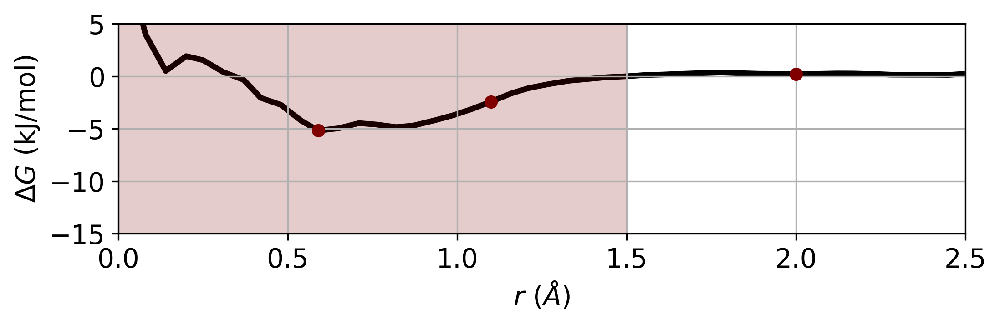

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(8, 2), dpi=300)
ax.plot(fe_x.x, fe_x.fe + 6.4, lw=3, c='black', zorder=1)
ax.set_xlim(-0.0, 2.5)
ax.set_ylim(-15, 5.0)
ax.grid()
ax.set_xlabel(r"$r$ $(\AA)$", fontsize=14)
ax.set_ylabel(r"$\Delta G$ (kJ/mol)", fontsize=14)
ax.set_yticks([-15, -10, -5, 0, 5])
ax.tick_params(axis="both", which='major', labelsize=14)
ax.fill_between([0.0, 1.5], -15, 5, color='#800000', alpha=0.2)
ax.scatter([0.59, 1.1, 2.0], fe_x[fe_x.x.isin([0.59, 1.1, 2.0])].fe + 6.4, color='#800000', zorder=2)

In [19]:
#fe_plot = fe_data[(fe_data.dcom<1.0) & (fe_data.dcom>0.5)]
fe_plot = fe_data[(fe_data.dcom<1.5)]
fe_plot = integrate_z_out(fe_plot, "ang", "cosb", "dcom")
fe_plot.fe += 6.4
#fe_plot = fe_data[fe_data.notna()]
#fe_plot = fe_plot[(fe_plot.fe < 10)]

In [29]:
fe_plot.fe.min()

-0.5738917784889326

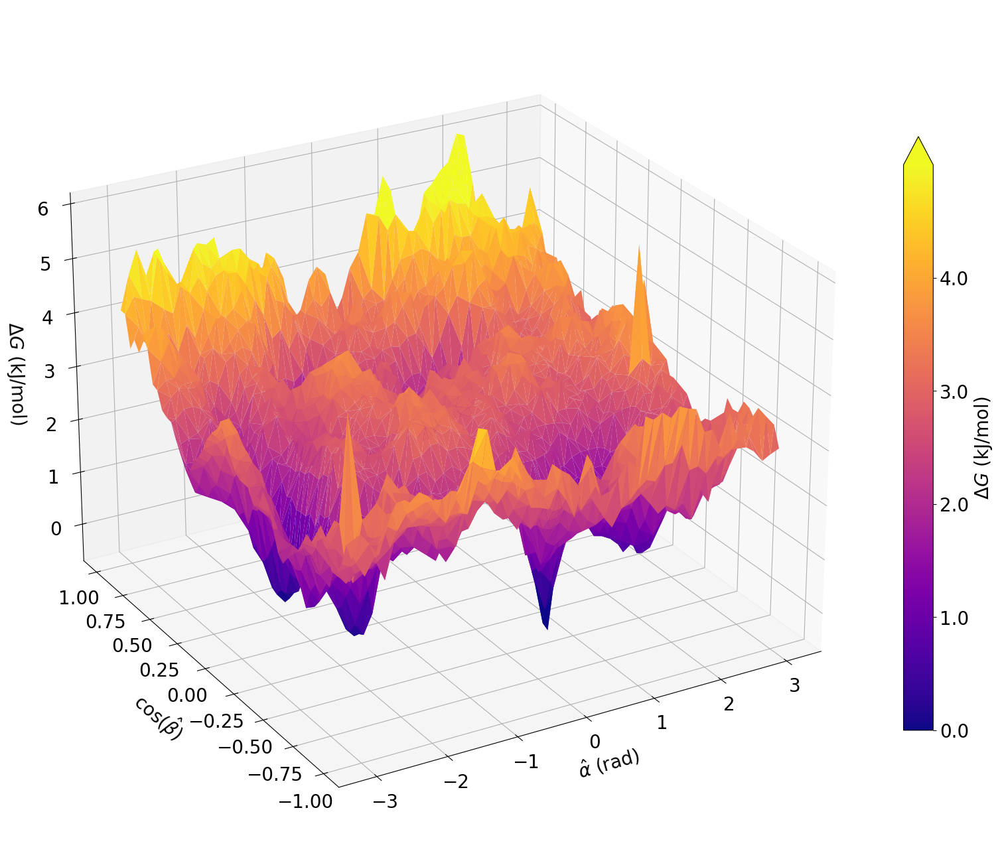

In [33]:
import matplotlib.cm as cm

# Assuming df is your DataFrame with columns: x, y, z, f
# Example: df = pd.DataFrame({'x': ..., 'y': ..., 'z': ..., 'f': ...})

fig = plt.figure(constrained_layout=True, figsize=(15, 15), dpi=100)
ax = fig.add_subplot(111, projection='3d')

# Normalize and plot trisurf with colormap
trisurf = ax.plot_trisurf(
    fe_plot['x'].to_numpy(), fe_plot['y'].to_numpy(), fe_plot['fe'].to_numpy(),
    cmap=cm.plasma,
    vmax=5.0,
    vmin=0.0,
    # Key line: color mapped using `f` as an array
    array=fe_plot['fe']
)

# Add a colorbar
cb = fig.colorbar(trisurf, ax=ax, shrink=0.6, extend="max")
cb.set_label(r"$\Delta G$ (kJ/mol)", fontsize=20)
cb.set_ticks(np.arange(0.0, 5.0, 1.0))
cb.set_ticklabels(np.arange(0.0, 5.0, 1.0), fontsize=20)

# Axis labels
ax.set_xlabel(r"$\hat{\alpha}$ (rad)", fontsize=20, labelpad=15)
ax.set_ylabel(r"$\cos(\hat{\beta})$", fontsize=20, labelpad=25)
ax.set_zlabel(r"$\Delta G$ (kJ/mol)", fontsize=20, labelpad=20)
ax.tick_params(axis="x", which='major', labelsize=20, pad=5)
ax.tick_params(axis="y", which='major', labelsize=20, pad=10)
ax.tick_params(axis="z", which='major', labelsize=20, pad=10)

#plt.tight_layout()
#ax.tick_params(axis='y', labelsize=0)
ax.view_init(elev=25, azim=-120)
plt.show()

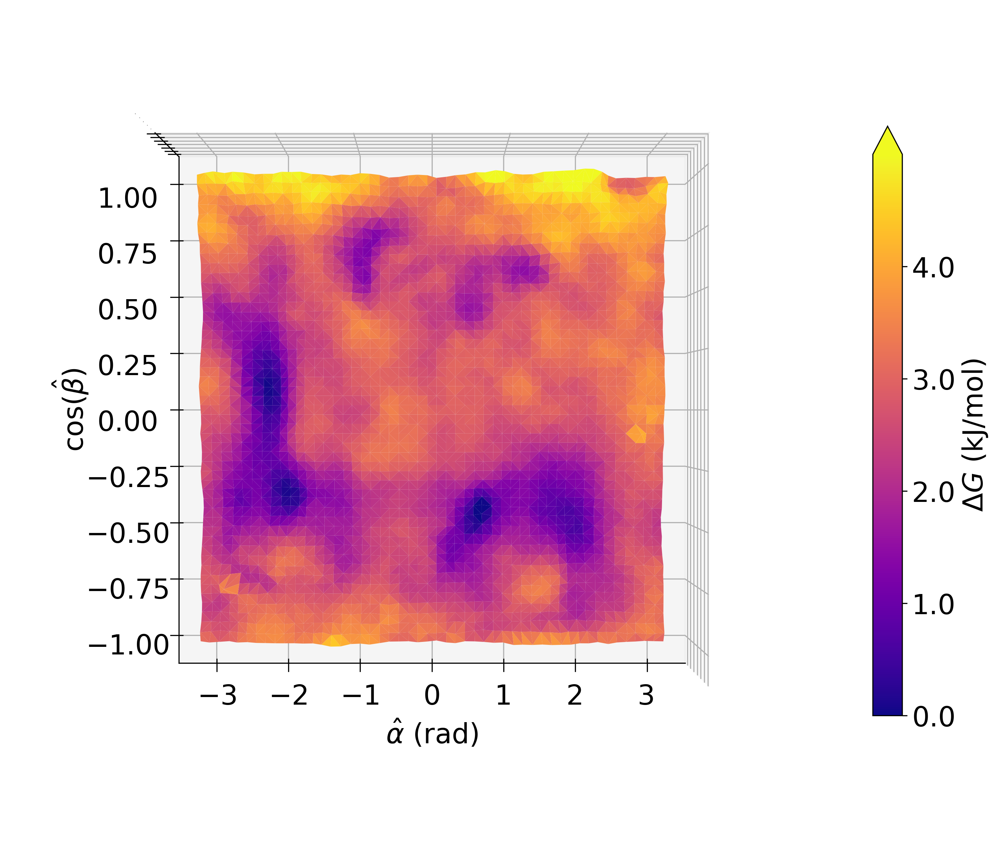

In [34]:
import matplotlib.cm as cm

# Assuming df is your DataFrame with columns: x, y, z, f
# Example: df = pd.DataFrame({'x': ..., 'y': ..., 'z': ..., 'f': ...})

fig = plt.figure(constrained_layout=True, figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Normalize and plot trisurf with colormap
trisurf = ax.plot_trisurf(
    fe_plot['x'].to_numpy(), fe_plot['y'].to_numpy(), fe_plot['fe'].to_numpy(),
    cmap=cm.plasma,
    vmax=5.0,
    vmin=0.0,
    # Key line: color mapped using `f` as an array
    array=fe_plot['fe']
)

# Add a colorbar
cb = fig.colorbar(trisurf, ax=ax, shrink=0.6, extend="max")
cb.set_label(r"$\Delta G$ (kJ/mol)", fontsize=20)
cb.set_ticks(np.arange(0., 5.0, 1.0))
cb.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=20)

# Axis labels
ax.set_xlabel(r"$\hat{\alpha}$ (rad)", fontsize=20, labelpad=25)
ax.set_ylabel(r"$\cos(\hat{\beta})$", fontsize=20, labelpad=50)
#ax.set_zlabel(r"$\Delta G$ (kJ/mol)", fontsize=14, labelpad=10)
ax.tick_params(axis="x", which='major', labelsize=20, pad=5)
ax.tick_params(axis="y", which='major', labelsize=20, pad=25)
#ax.tick_params(axis="z", which='major', labelsize=14, pad=50)

#plt.tight_layout()
ax.tick_params(axis='z', labelsize=0)   
ax.view_init(elev=90, azim=-90)
plt.show()

In [35]:
def set_axes_equal(ax):
    """Set equal scaling for 3D plot axes."""
    limits = np.array([ax.get_xlim3d(), ax.get_ylim3d(), ax.get_zlim3d()])
    centers = np.mean(limits, axis=1)
    ranges = 0.5 * (limits[:, 1] - limits[:, 0])
    max_range = ranges.max()
    for ctr, rng in zip(centers, ranges):
        ax.set_xlim3d([centers[0] - max_range, centers[0] + max_range])
        ax.set_ylim3d([centers[1] - max_range, centers[1] + max_range])
        ax.set_zlim3d([centers[2] - max_range, centers[2] + max_range])

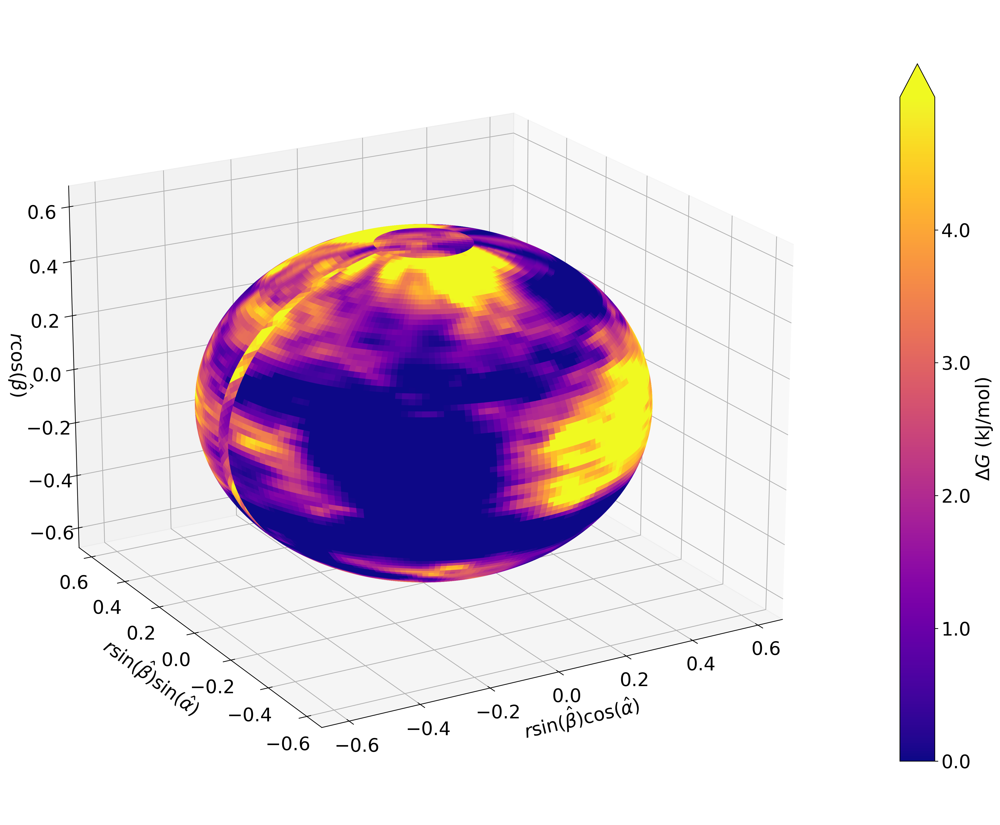

In [36]:
sph_plot_data = fe_data.copy()
sph_plot_data.rename(columns={"dcom": "r", "ang":"theta"}, inplace=True)
sph_plot_data['phi'] = np.acos(sph_plot_data['cosb'])
r = 0.59
r_data = sph_plot_data[sph_plot_data.r == r]
r_data = r_data.dropna()

# Extract columns
phi = r_data["phi"].values
theta = r_data["theta"].values
values = r_data["fe"].values + 6.4

# Create a fine spherical grid
theta_fine = np.linspace(-np.pi, np.pi, 200)
phi_fine = np.linspace(0, np.pi, 100)
theta_fine, phi_fine = np.meshgrid(theta_fine, phi_fine)

# Interpolate values onto the fine grid
points = np.array([theta, phi]).T
values_fine = griddata(points, values, (theta_fine, phi_fine), method='cubic')

# Convert fine spherical grid to Cartesian
# Radius
x_fine = r * np.sin(phi_fine) * np.cos(theta_fine)
y_fine = r * np.sin(phi_fine) * np.sin(theta_fine)
z_fine = r * np.cos(phi_fine)

# Plot the smooth interpolated spherical grid
fig = plt.figure(constrained_layout=True, figsize=(15, 15), dpi=300)
ax = fig.add_subplot(111, projection='3d')
norm = plt.Normalize(vmin=0.0, vmax=5.0)  # Normalize colors
surface = ax.plot_surface(
    x_fine, y_fine, z_fine, facecolors=plt.cm.plasma(norm(values_fine)),
    rstride=1, cstride=1, antialiased=True, shade=False
)

# Add a colorbar
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='plasma'), ax=ax, shrink=0.7, pad=0.1, extend="max")
cbar.set_label(r"$\Delta G$ (kJ/mol)", fontsize=20)
cbar.set_ticks(np.arange(0., 5.0, 1.0))
cbar.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=20)
ax.view_init(elev=20, azim=-120)
set_axes_equal(ax)

ax.set_xlabel(r"$r\sin(\hat{\beta})\cos(\hat{\alpha})$", fontsize=20, labelpad=15)
ax.set_ylabel(r"$r\sin(\hat{\beta})\sin(\hat{\alpha})$", fontsize=20, labelpad=20)
ax.set_zlabel(r"$r\cos(\hat{\beta})$", fontsize=20, labelpad=15)
ax.tick_params(axis="x", which='major', labelsize=20, pad=5)
ax.tick_params(axis="y", which='major', labelsize=20, pad=10)
ax.tick_params(axis="z", which='major', labelsize=20, pad=10)
plt.show()

/Users/arminsh/miniconda3/envs/botorch/lib/python3.10/site-packages/matplotlib/tri/_triangulation.py:181: RuntimeWarning: invalid value encountered in cast
  triangles = np.asarray(triangles, dtype=np.int32)


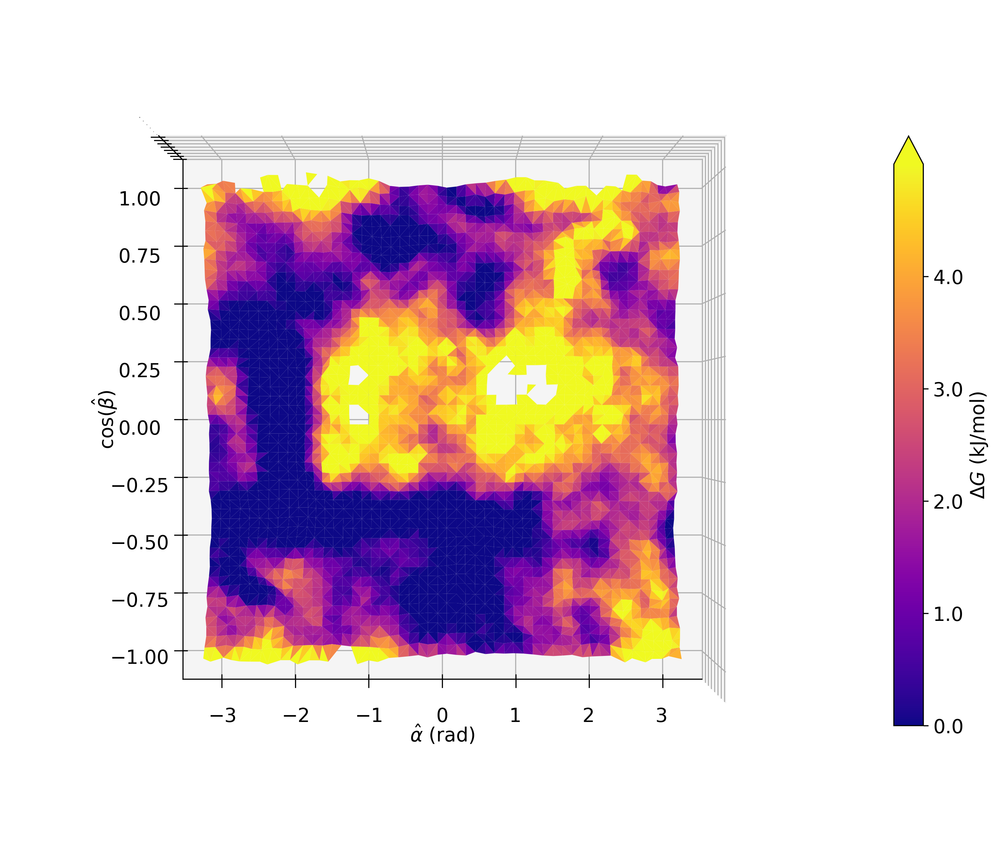

In [37]:

fe_plot = fe_data[(fe_data.dcom==0.59)].copy()
fe_plot.fe += 6.4
#fe_plot = integrate_z_out(fe_plot, "ang", "cosb", "dcom")
fe_plot = fe_plot.rename(columns={"ang": "x", "cosb": "y"})
fe_plot.dropna()


fig = plt.figure(constrained_layout=True, figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Normalize and plot trisurf with colormap
trisurf = ax.plot_trisurf(
    fe_plot['x'].to_numpy(), fe_plot['y'].to_numpy(), fe_plot['fe'].to_numpy(),
    cmap=cm.plasma,
    vmax=5.0,
    vmin=0.0,
    # Key line: color mapped using `f` as an array
    array=fe_plot['fe']
)

# Add a colorbar
cb = fig.colorbar(trisurf, ax=ax, shrink=0.6, extend="max")
cb.set_label(r"$\Delta G$ (kJ/mol)", fontsize=14)
cb.set_ticks(np.arange(0., 5.0, 1.0))
cb.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=14)

# Axis labels
ax.set_xlabel(r"$\hat{\alpha}$ (rad)", fontsize=14, labelpad=15)
ax.set_ylabel(r"$\cos(\hat{\beta})$", fontsize=14, labelpad=30)
#ax.set_zlabel(r"$\Delta G$ (kJ/mol)", fontsize=14, labelpad=10)
ax.tick_params(axis="x", which='major', labelsize=14, pad=10)
ax.tick_params(axis="y", which='major', labelsize=14, pad=20)
#ax.tick_params(axis="z", which='major', labelsize=14, pad=50)

#plt.tight_layout()
ax.tick_params(axis='z', labelsize=0)   
ax.view_init(elev=90, azim=-90)
plt.show()

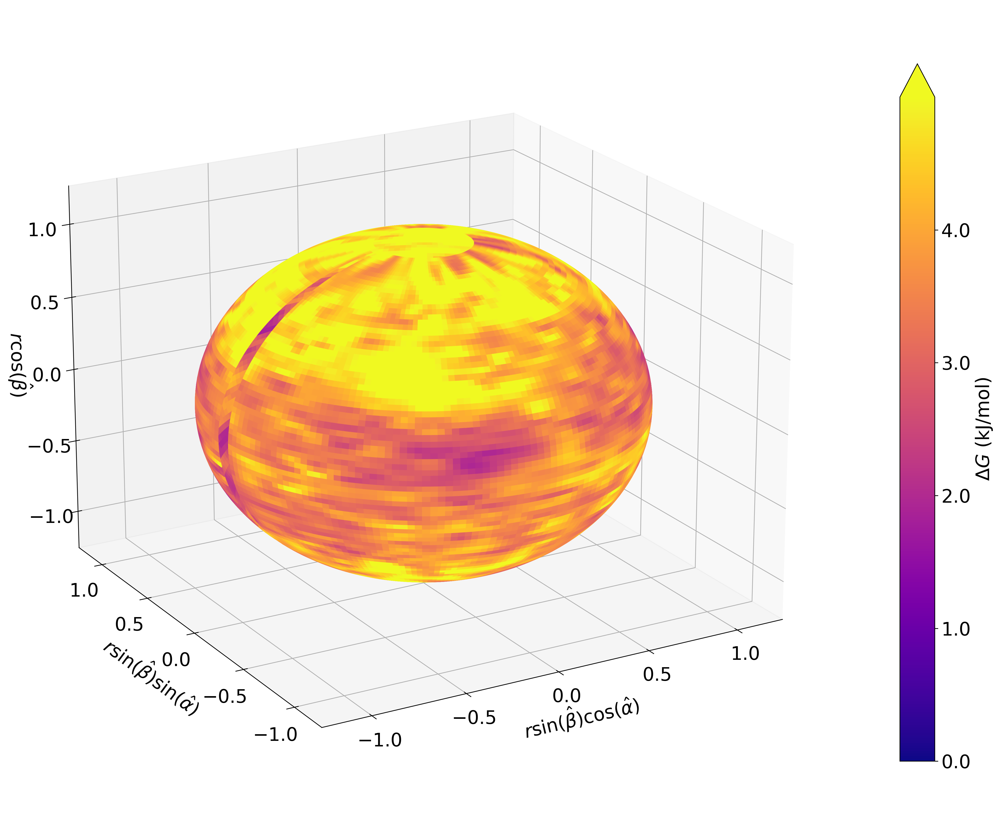

In [38]:
sph_plot_data = fe_data.copy()
sph_plot_data.rename(columns={"dcom": "r", "ang":"theta"}, inplace=True)
sph_plot_data['phi'] = np.acos(sph_plot_data['cosb'])
r = 1.1
r_data = sph_plot_data[sph_plot_data.r == r]
r_data = r_data.dropna()

# Extract columns
phi = r_data["phi"].values
theta = r_data["theta"].values
values = r_data["fe"].values + 6.4

# Create a fine spherical grid
theta_fine = np.linspace(-np.pi, np.pi, 200)
phi_fine = np.linspace(0, np.pi, 100)
theta_fine, phi_fine = np.meshgrid(theta_fine, phi_fine)

# Interpolate values onto the fine grid
points = np.array([theta, phi]).T
values_fine = griddata(points, values, (theta_fine, phi_fine), method='cubic')

# Convert fine spherical grid to Cartesian
# Radius
x_fine = r * np.sin(phi_fine) * np.cos(theta_fine)
y_fine = r * np.sin(phi_fine) * np.sin(theta_fine)
z_fine = r * np.cos(phi_fine)

# Plot the smooth interpolated spherical grid
fig = plt.figure(constrained_layout=True, figsize=(15, 15), dpi=300)
ax = fig.add_subplot(111, projection='3d')
norm = plt.Normalize(vmin=0.0, vmax=5.0)  # Normalize colors
surface = ax.plot_surface(
    x_fine, y_fine, z_fine, facecolors=plt.cm.plasma(norm(values_fine)),
    rstride=1, cstride=1, antialiased=True, shade=False
)

# Add a colorbar
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='plasma'), ax=ax, shrink=0.7, pad=0.1, extend="max")
cbar.set_label(r"$\Delta G$ (kJ/mol)", fontsize=20)
cbar.set_ticks(np.arange(0., 5.0, 1.0))
cbar.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=20)
ax.view_init(elev=20, azim=-120)
set_axes_equal(ax)

ax.set_xlabel(r"$r\sin(\hat{\beta})\cos(\hat{\alpha})$", fontsize=20, labelpad=15)
ax.set_ylabel(r"$r\sin(\hat{\beta})\sin(\hat{\alpha})$", fontsize=20, labelpad=20)
ax.set_zlabel(r"$r\cos(\hat{\beta})$", fontsize=20, labelpad=15)
ax.tick_params(axis="x", which='major', labelsize=20, pad=5)
ax.tick_params(axis="y", which='major', labelsize=20, pad=10)
ax.tick_params(axis="z", which='major', labelsize=20, pad=10)
plt.show()

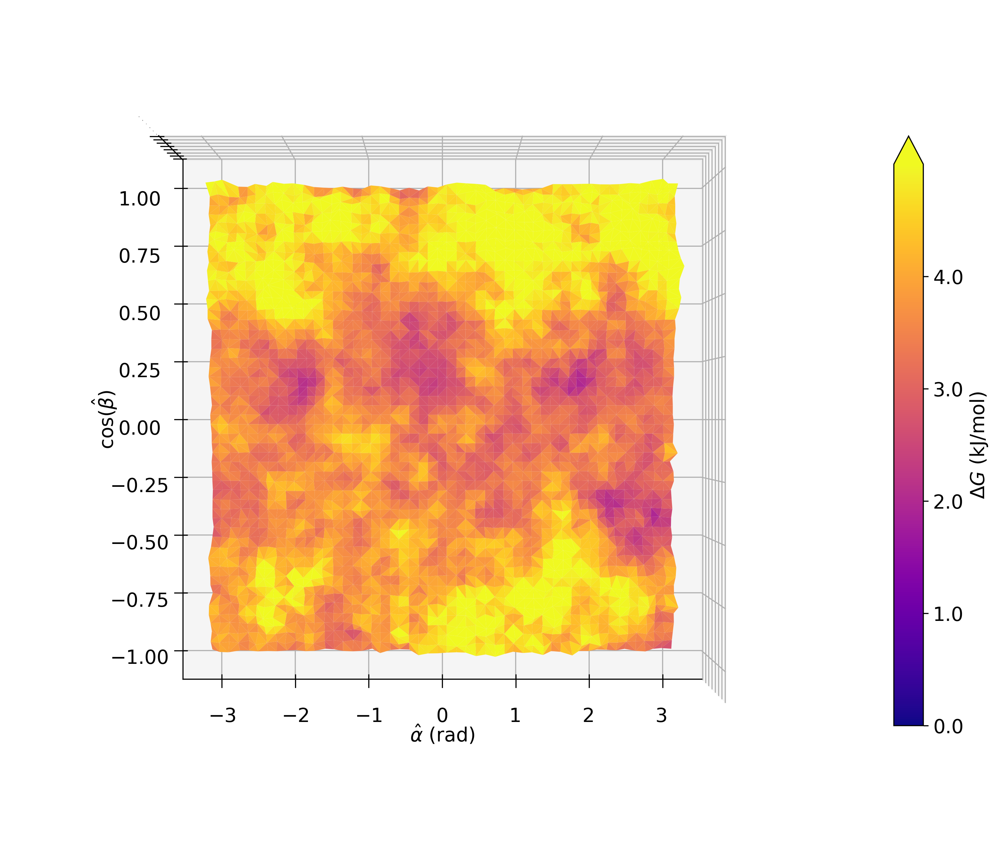

In [39]:
fe_plot = fe_data[(fe_data.dcom==1.1)].copy()
fe_plot.fe += 6.4
#fe_plot = integrate_z_out(fe_plot, "ang", "cosb", "dcom")
fe_plot = fe_plot.rename(columns={"ang": "x", "cosb": "y"})
fe_plot.dropna()


fig = plt.figure(constrained_layout=True, figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Normalize and plot trisurf with colormap
trisurf = ax.plot_trisurf(
    fe_plot['x'].to_numpy(), fe_plot['y'].to_numpy(), fe_plot['fe'].to_numpy(),
    cmap=cm.plasma,
    vmax=5.0,
    vmin=0.0,
    # Key line: color mapped using `f` as an array
    array=fe_plot['fe']
)

# Add a colorbar
cb = fig.colorbar(trisurf, ax=ax, shrink=0.6, extend="max")
cb.set_label(r"$\Delta G$ (kJ/mol)", fontsize=14)
cb.set_ticks(np.arange(0., 5.0, 1.0))
cb.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=14)

# Axis labels
ax.set_xlabel(r"$\hat{\alpha}$ (rad)", fontsize=14, labelpad=15)
ax.set_ylabel(r"$\cos(\hat{\beta})$", fontsize=14, labelpad=30)
#ax.set_zlabel(r"$\Delta G$ (kJ/mol)", fontsize=14, labelpad=10)
ax.tick_params(axis="x", which='major', labelsize=14, pad=10)
ax.tick_params(axis="y", which='major', labelsize=14, pad=20)
#ax.tick_params(axis="z", which='major', labelsize=14, pad=50)

#plt.tight_layout()
ax.tick_params(axis='z', labelsize=0)   
ax.view_init(elev=90, azim=-90)
plt.show()

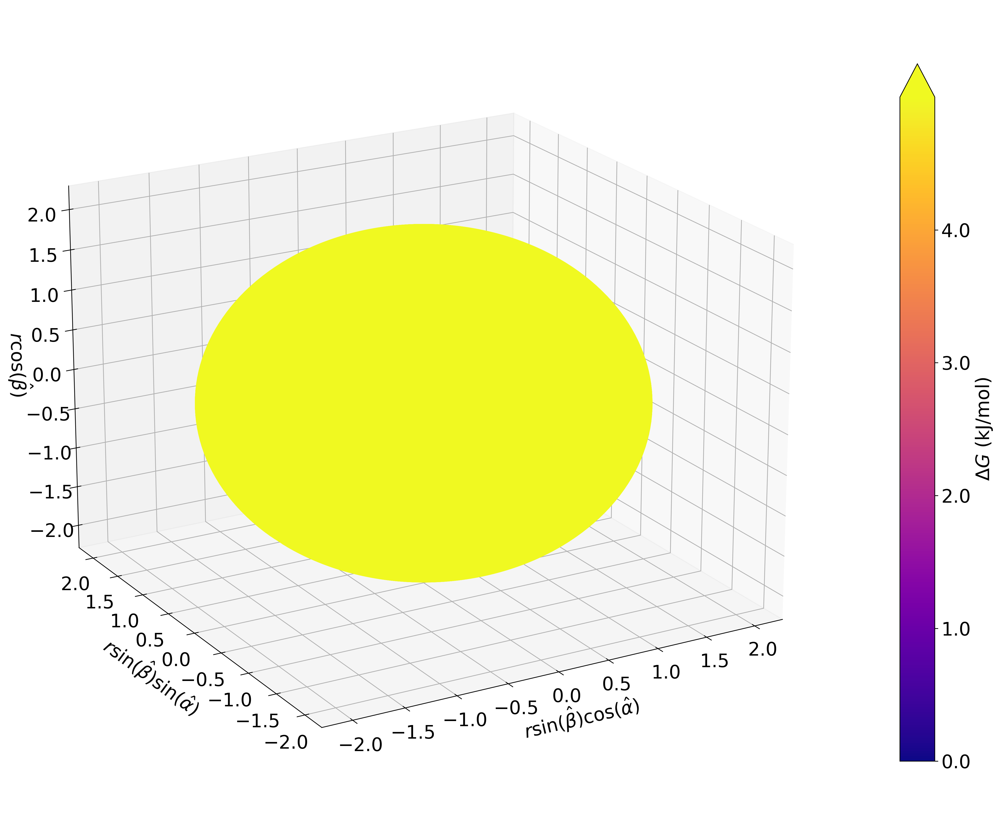

In [40]:
sph_plot_data = fe_data.copy()
sph_plot_data.rename(columns={"dcom": "r", "ang":"theta"}, inplace=True)
sph_plot_data['phi'] = np.acos(sph_plot_data['cosb'])
r = 2.0
r_data = sph_plot_data[sph_plot_data.r == r]
r_data = r_data.dropna()

# Extract columns
phi = r_data["phi"].values
theta = r_data["theta"].values
values = r_data["fe"].values + 6.4

# Create a fine spherical grid
theta_fine = np.linspace(-np.pi, np.pi, 200)
phi_fine = np.linspace(0, np.pi, 100)
theta_fine, phi_fine = np.meshgrid(theta_fine, phi_fine)

# Interpolate values onto the fine grid
points = np.array([theta, phi]).T
values_fine = griddata(points, values, (theta_fine, phi_fine), method='cubic')

# Convert fine spherical grid to Cartesian
# Radius
x_fine = r * np.sin(phi_fine) * np.cos(theta_fine)
y_fine = r * np.sin(phi_fine) * np.sin(theta_fine)
z_fine = r * np.cos(phi_fine)

# Plot the smooth interpolated spherical grid
fig = plt.figure(constrained_layout=True, figsize=(15, 15), dpi=300)
ax = fig.add_subplot(111, projection='3d')
norm = plt.Normalize(vmin=0.0, vmax=5.0)  # Normalize colors
surface = ax.plot_surface(
    x_fine, y_fine, z_fine, facecolors=plt.cm.plasma(norm(values_fine)),
    rstride=1, cstride=1, antialiased=True, shade=False
)

# Add a colorbar
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='plasma'), ax=ax, shrink=0.7, pad=0.1, extend="max")
cbar.set_label(r"$\Delta G$ (kJ/mol)", fontsize=20)
cbar.set_ticks(np.arange(0., 5.0, 1.0))
cbar.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=20)
ax.view_init(elev=20, azim=-120)
set_axes_equal(ax)

ax.set_xlabel(r"$r\sin(\hat{\beta})\cos(\hat{\alpha})$", fontsize=20, labelpad=15)
ax.set_ylabel(r"$r\sin(\hat{\beta})\sin(\hat{\alpha})$", fontsize=20, labelpad=20)
ax.set_zlabel(r"$r\cos(\hat{\beta})$", fontsize=20, labelpad=15)
ax.tick_params(axis="x", which='major', labelsize=20, pad=5)
ax.tick_params(axis="y", which='major', labelsize=20, pad=10)
ax.tick_params(axis="z", which='major', labelsize=20, pad=10)
plt.show()

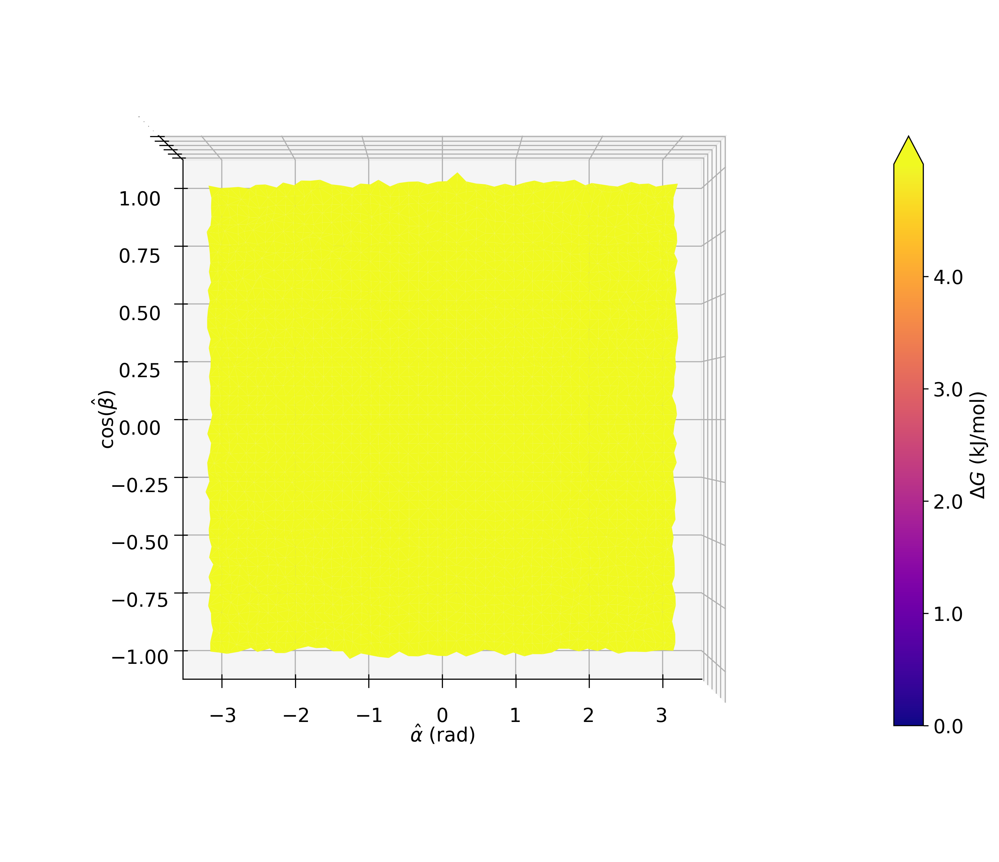

In [41]:
fe_plot = fe_data[(fe_data.dcom==2.0)].copy()
fe_plot.fe += 6.4
#fe_plot = integrate_z_out(fe_plot, "ang", "cosb", "dcom")
fe_plot = fe_plot.rename(columns={"ang": "x", "cosb": "y"})
fe_plot.dropna()


fig = plt.figure(constrained_layout=True, figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Normalize and plot trisurf with colormap
trisurf = ax.plot_trisurf(
    fe_plot['x'].to_numpy(), fe_plot['y'].to_numpy(), fe_plot['fe'].to_numpy(),
    cmap=cm.plasma,
    vmax=5.0,
    vmin=0.0,
    # Key line: color mapped using `f` as an array
    array=fe_plot['fe']
)

# Add a colorbar
cb = fig.colorbar(trisurf, ax=ax, shrink=0.6, extend="max")
cb.set_label(r"$\Delta G$ (kJ/mol)", fontsize=14)
cb.set_ticks(np.arange(0., 5.0, 1.0))
cb.set_ticklabels(np.arange(0., 5.0, 1.0), fontsize=14)

# Axis labels
ax.set_xlabel(r"$\hat{\alpha}$ (rad)", fontsize=14, labelpad=15)
ax.set_ylabel(r"$\cos(\hat{\beta})$", fontsize=14, labelpad=30)
#ax.set_zlabel(r"$\Delta G$ (kJ/mol)", fontsize=14, labelpad=10)
ax.tick_params(axis="x", which='major', labelsize=14, pad=10)
ax.tick_params(axis="y", which='major', labelsize=14, pad=20)
#ax.tick_params(axis="z", which='major', labelsize=14, pad=50)

#plt.tight_layout()
ax.tick_params(axis='z', labelsize=0)   
ax.view_init(elev=90, azim=-90)
plt.show()